In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import preliz as pz
import pymc as pm

import gEconpy as ge
import gEconpy.plotting as gp

from gEconpy.model.statespace import data_from_prior

gp.set_matplotlib_style()

In [2]:
RANDOM_SEED = sum(map(ord, "DSGE Estimation"))
rng = np.random.default_rng(RANDOM_SEED)

# Estimating a DSGE Model

To estimate a model, `gEconpy` uses PyMC, specifically the `pymc-extras` statespace module. To do this, you first have to compile a GCN file to a statespace model using `ge.statespace_from_gcn`.

Like `ge.model_from_gcn`, this will show a build report. Unlike `model_from_gcn`, you will not be able to do experiments with the steady state or linearization. Instead, everything is re-oriented towards estimation.

In [3]:
file_path = ge.data.get_example_gcn("RBC")
ge.print_gcn_file(file_path)

In [4]:
ss_mod = ge.statespace_from_gcn(file_path, log_linearize=True)

Model Building Complete.
Found:
	9 equations
	9 variables
		The following variables were eliminated at user request:
			TC_t, U_t
		The following "variables" were defined as constants and have been substituted away:
			mc_t
	1 stochastic shock
		 0 / 1 have a defined prior.
	6 parameters
		 6 / 6 have a defined prior.
	0 parameters to calibrate.
	9 / 9 variables have analytical steady-state values.
		9 user-provided: A_ss, C_ss, I_ss, K_ss, L_ss, Y_ss, lambda_ss, 
                                 r_ss, w_ss
Model appears well defined and ready to proceed to solving.



Statespace model construction complete, but call the .configure method to finalize.


Unlike `ge.model_from_gcn`, we do not get back a `gEconpy.Model` object. Instead, we get a `DSGEStateSpace` object. This inherits from class:`pymc_extras.statespace.core.PyMCStatespace`, but extended for extra functionality relevant to DSGE modeling.

In [5]:
type(ss_mod)

gEconpy.model.statespace.DSGEStateSpace

You are still able to see the underlying model equations that were parsed from the GCN file. The parser used to create `DSGEStateSpace` is identical to that used for `Model`.

In [6]:
for eq in ss_mod.equations:
    display(eq)

-C_t - I_t + K_t-1*r_t + L_t*w_t

I_t - K_t + K_t-1*(1 - delta)

-lambda_t + C_t**(-sigma_C)

-L_t**sigma_L + lambda_t*w_t

beta*(lambda_t+1*r_t+1 - lambda_t+1*(delta - 1)) - lambda_t

A_t*K_t-1**alpha*L_t**(1 - alpha) - Y_t

alpha*Y_t/K_t-1 - r_t

-w_t + Y_t*(1 - alpha)/L_t

rho_A*log(A_t-1) + epsilon_A_t - log(A_t)

Calibrated parameter values are also stored in the `param_dict` property

In [7]:
ss_mod.param_dict

{'alpha': 0.35,
 'beta': 0.99,
 'delta': 0.02,
 'rho_A': 0.95,
 'sigma_C': 1.5,
 'sigma_L': 2.0}

We'll save this list of parameters so we can look at them after estimation

In [8]:
deep_params = list(ss_mod.param_dict.keys())

As are the names of the state variables in the model

In [9]:
ss_mod.state_names

('A', 'C', 'I', 'K', 'L', 'Y', 'lambda', 'r', 'w')

And stochastic shock terms

In [10]:
ss_mod.shock_names

('epsilon_A',)

## Choosing Priors

In this GCN file, we have defined priors over all 6 parameters. When priors are defined, they are converted into `preliz` distributions. `preliz` is a package dedicated to prior elicidation. It makes it easy to visualize, play with, and adjust distributions. 

All distributions defined in the CGN file are stored in `ss_mod.param_priors`

In [11]:
ss_mod.param_priors

{'beta': Beta(alpha=181, beta=3.55),
 'delta': Beta(alpha=11.5, beta=409),
 'sigma_C': Gamma(alpha=6.66, beta=1.43),
 'sigma_L': Gamma(alpha=6.62, beta=1.42),
 'alpha': Beta(alpha=21.8, beta=41.6),
 'rho_A': Beta(alpha=18.2, beta=2.22)}

These can be visualized by using the `.plot_pdf`, `.plot_cdf`, or `.plot_interactive` methods. These have lots of options for adding different statistics to the plot. In the next cell, we make a plot that shows several of these.

<Axes: >

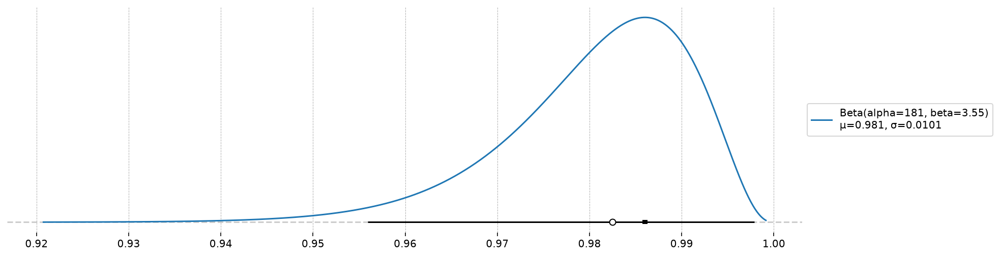

In [12]:
d = ss_mod.param_priors["beta"]
d.plot_pdf(moments="md", pointinterval=True, interval="hdi", levels=(0.025, 0.975))

To plot all priors together, we offer `gEconpy.plotting.plot_priors`. This also drops a veritical line at the calibrated value declared in the GCN file, if any.

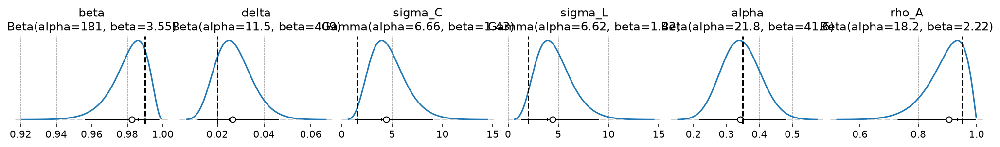

In [13]:
gp.plot_priors(ss_mod);

Declaring priors in a GCN file is totally optional, as is using `preliz`. In the end, you will be able to use any PyMC priors you please, via the `pymc_extras.statespace` API. 


## Configuring the model

To set up a statespace model, you first have to call the `.configure` method. This finalizes model settings, by allowing you to choose:

- `observed_states`: Which states in the DSGE model are observed 
- `measurement_error`: Which observed states have associated measurement error
- `full_shock_covariance`: Whether to estimate a full shock covariance matrix, or just the diagonal elements
- `mode`: Which computational backend to compile the model `logp` function to. See the pytensor documentation for details about the choices.
- `solver`: Which algorithm to use for finding the linear policy function. Choices are `gensys`, `cycle_reduction`, or `scan_cycle_reduction`. Only `scan_cycle_reduction` is supported when `mode="JAX"`, but `mode="NUMBA"` (the default) support all choices.
- `use_adjoint_gradients`: Whether to autodiff through the `scan_cycle_reduction` algorithm (`False`), or to directly use an analytical solution (`True`). The analytical solution is recommended. For other choices, adjoint gradients are always used.
- `max_iter`: The maximum number of iterations allowed to the `cycle_reduction` algorithm. Because of how looping works in autodiff, loops must always run for the maximum number of iterators. If convregence is detected before the maximum iteration, computation is replaced with the identity function, but it's still not "free". Thus, a low number (10-20), is recommended here to maximimze performance.

Recall that a statespace model can only have as many observed states as there are sources of stochastic variation. Since this model has only one stochastic shock, we will observe only one variable, `Y`.

In [14]:
ss_mod.configure(
    observed_states=["Y"],
    measurement_error=None,
    full_shock_covariance=False,
    solver="scan_cycle_reduction",
    use_adjoint_gradients=True,
    max_iter=20,
)

                  Model Requirements                  
                                                      
  Variable          Shape   Constraints   Dimensions  
 ──────────────────────────────────────────────────── 
  alpha             ()                          None  
  beta              ()                          None  
  delta             ()                          None  
  rho_A             ()                          None  
  sigma_C           ()                          None  
  sigma_L           ()                          None  
  sigma_epsilon_A   ()      Positive            None  
                                                      
 These parameters should be assigned priors inside a  
         PyMC model block before calling the          
            build_statespace_graph method.            

After calling the `.configure` method, we recieve this Model Requirements table, telling us what needs to be declared inside a `pm.Model` context. This is done exactly like all statespace models, so check the statespace model documentation for more details. 

As noted above, using `preliz` priors is totally optional. Here we define the entire model with `pymc` priors.

To see how the priors look, we can use `pm.sample_prior_predictive`.

In [15]:
with pm.Model(coords=ss_mod.coords) as pm_mod:
    alpha = pm.Beta("alpha", alpha=2, beta=10)
    beta = pm.Beta("beta", alpha=2, beta=30)
    delta = pm.Beta("delta", alpha=1, beta=30)
    rho_A = pm.Beta("rho_A", alpha=10, beta=2)
    sigma_C = pm.TruncatedNormal("sigma_C", mu=1.5, sigma=2, lower=1.01, upper=np.inf)
    sigma_L = pm.TruncatedNormal("sigma_L", mu=1.5, sigma=2, lower=1, upper=np.inf)
    sigma_epsilon_A = pm.Exponential("sigma_epsilon_A", 10)

    priors = pm.sample_prior_predictive(draws=2000, random_seed=rng)

Sampling: [alpha, beta, delta, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


In [16]:
az.summary(priors, group="prior")

,mean,sd,eti89_lb,eti89_ub,ess_bulk,ess_tail,r_hat,mcse_mean,mcse_sd
rho_A,0.835,0.105,0.63,0.96,1974,1872,nan,0.0023,0.002
alpha,0.166,0.104,0.034,0.36,1674,1747,nan,0.0025,0.0021
sigma_L,2.78,1.28,1.2,5.1,1926,1816,nan,0.029,0.026
beta,0.061,0.041,0.012,0.14,1854,1986,nan,0.00093,0.00083
sigma_epsilon_A,0.101,0.102,0.0053,0.3,2245,2075,nan,0.0022,0.0029
delta,0.032,0.031,0.0017,0.094,1986,1747,nan,0.00071,0.00084
sigma_C,2.81,1.33,1.2,5.3,1948,1927,nan,0.03,0.026


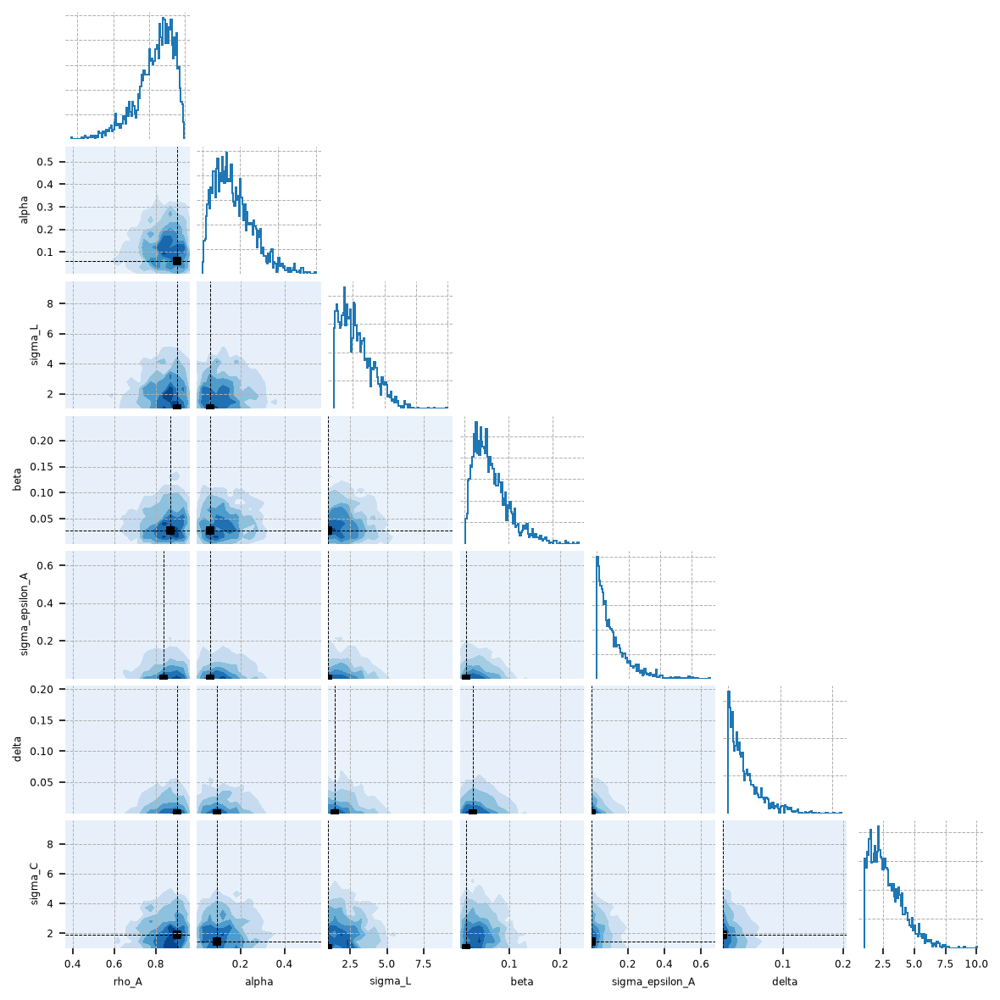

In [17]:
fig = gp.plot_corner(
    priors,
    group="prior",
    figure_kwargs={"figsize": (8, 8), "dpi": 144, "layout": "constrained"},
);

Since priors were defined in the GCN file, we can load those priors using `ss_mod.to_pymc()`. You will still need to manually define priors for those which were not included. In this case, we need to manually give a prior to `sigma_epsilon_A`.

In [18]:
# Save this for plotting later
prior_dict = ss_mod.param_priors.copy()

with pm.Model(coords=ss_mod.coords) as pm_mod:
    ss_mod.to_pymc()

    # Save sigma_epsilon_A in preliz format so we can compare it against the posteriors later
    prior_dict["sigma_epsilon_A"] = pz.maxent(pz.Gamma(), lower=0.01, upper=0.05, plot=False)
    prior_dict["sigma_epsilon_A"].to_pymc("sigma_epsilon_A")

    prior = pm.sample_prior_predictive(2000, random_seed=rng)

Sampling: [alpha, beta, delta, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


In [19]:
# In case we want everything, not just the deep_params
all_params = list(prior_dict.keys())

In [20]:
az.summary(prior, group="prior")

,mean,sd,eti89_lb,eti89_ub,ess_bulk,ess_tail,r_hat,mcse_mean,mcse_sd
rho_A,0.892,0.067,0.76,0.97,1717,1831,nan,0.0016,0.0014
alpha,0.344,0.059,0.25,0.44,1945,1743,nan,0.0013,0.00095
sigma_L,4.65,1.8,2.1,7.7,1915,1835,nan,0.041,0.033
beta,0.9802,0.0103,0.96,0.99,1922,1739,nan,0.00024,0.00024
sigma_epsilon_A,0.0303,0.0135,0.012,0.054,1978,1951,nan,0.0003,0.00028
delta,0.0274,0.0079,0.016,0.041,1875,1908,nan,0.00018,0.00014
sigma_C,4.68,1.8,2.2,7.8,1894,1710,nan,0.041,0.036


## Generating artifical data and prior predictive checking

Either way, once we're happy, we can call `ss_mod.build_statespace_graph`, passing in observed data. In this case we don't have observed data, so we will need to generate some from the priors. A helper function, `data_from_priors`, is available to help you do that.

This prior predictive workflow is also useful for checking model calibration and identification. If you cannot recover "true" parameter values when data are actually generated by the model, you either have a model error, or you need to go back to the drawing board. 

In [21]:
true_params, data, prior_idata = data_from_prior(ss_mod, pm_mod, random_seed=rng)
true_param_dict = {param: true_params[param].item() for param in all_params}

Sampling: [alpha, beta, delta, obs, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


Sampling: [prior_combined]


`data_from_prior` returns many parameter draws from the prior, along with model trajectories generated using those parameter draws. It also selects a single draw and splits off 1) a trajectory over observed data for that draw (that is, data with measurement error, if any), and the parameter values that were used to generate that data. 

Here is the trajectory over log deviation from steady-state GDP that was generated by the priors

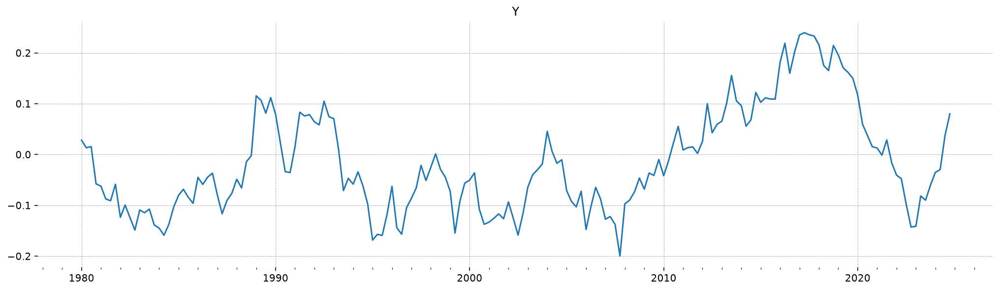

In [22]:
gp.plot_timeseries(data);

And we can also check the parameter values that generated that draw. We also get back a couple diagonostic values, including:

- `ss_resid`: The residual of the steady-state at the parameter draw
- `deterministic_norm`: The norm assoicated with inaccuracies in the deterministic part of the statespace
- `stochastic_norm`: The norm associated with inaccuracies in the stochastic part of the statespace
- `n_cycle_steps`: How many steps of cycle reduction were necessary to compute the policy function
- `param_idx`: The index associated with the draw chosen for the fake data.

In [23]:
true_params

<xarray.Dataset> Size: 104B
Dimensions:             ()
Coordinates:
    chain               int64 8B 0
    draw                int64 8B 449
Data variables:
    rho_A               float64 8B 0.8847
    stochastic_norm     float64 8B 3.262e-16
    alpha               float64 8B 0.3734
    sigma_L             float64 8B 3.922
    n_cycle_steps       int64 8B 10
    deterministic_norm  float64 8B 5.072e-16
    beta                float64 8B 0.9753
    sigma_epsilon_A     float64 8B 0.03433
    delta               float64 8B 0.02739
    sigma_C             float64 8B 4.405
    param_idx           int64 8B 449
Attributes:
    created_at:                 2026-09-16T15:42:24.920087+00:00
    creation_library:           ArviZ
    creation_library_version:   1.3.0
    creation_library_language:  Python
    inference_library:          pymc
    inference_library_version:  6.3.1
    sample_dims:                ['chain', 'draw']

Since we know the draw, we can also go in and check the "true" latent states (the model states that are not observed), and see how well we do at recovering those after estimation.

In [24]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(chain=0, draw=true_params.param_idx)
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

Note that since there is no measurement error in this model, the latent Y and the observed Y will be identical.

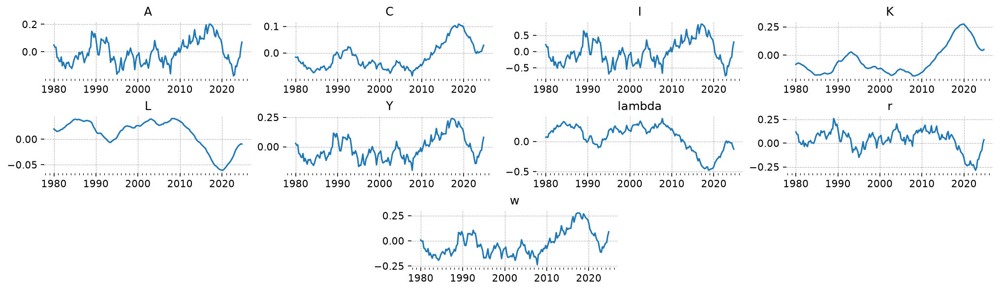

In [25]:
gp.plot_timeseries(latent_data);

# Estimating the model 

To actually estimate the model, the first thing we have to do is to call `ss_mod.build_statespace_graph` inside the PyMC model context. This method has several options related to penalty terms we can add to the loglikelihood. It is recommended to add all of these, as they bias the model away from parameter values that don't result in a steady state solution, or that don't satisfy Blanchard-Kahn conditions.

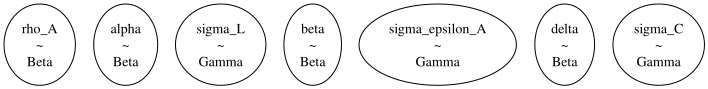

In [26]:
pm_mod.to_graphviz()

In [27]:
with pm_mod:
    ss_mod.build_statespace_graph(
        data,
        add_solver_success_check=True,
    )

As you can see, a Kalman filter was set up for us, along with three penalty terms that will be added to the logp. These penalty terms should help with stability during fitting!

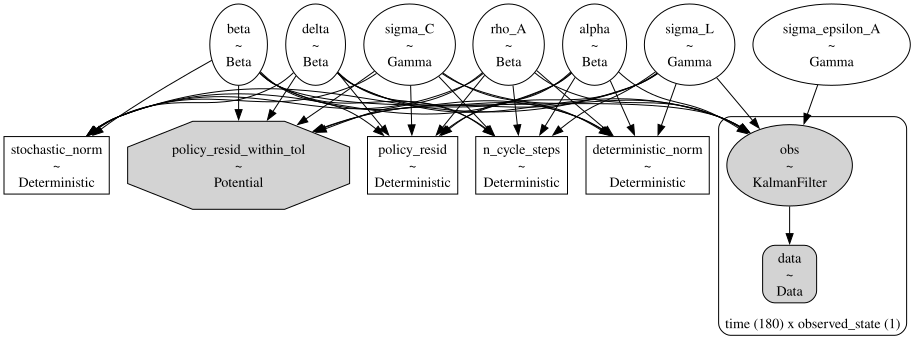

In [28]:
pm_mod.to_graphviz()

## Laplace Approximation

To actually fit the model, many algorithms are available. `gEconpy` uses `pytensor` to construct a fully differentiable computational graph, allowing access to gradients and even hessians of any scalar loss function you like. Typically, however, we just work with the log probability of the data under the model.

The simplest way thing to do is to directly minimize the logp. In the Bayesian literature, this is called Maximum a Posteriori (MAP) estimation. It can be combined with a Laplace (or Quadratic) approximation to obtain posterior distributions. Using this method, the inverse Hessian of the logp is used as a covariance matrix, and the posterior is approximated as a Multivariate normal distribution.

To do MAP estimation, use `pymc_extras.fit_laplace`

In [29]:
from pymc_extras import fit_laplace

with pm_mod:
    idata_laplace = fit_laplace(
        optimize_method="trust-ncg", optimizer_kwargs={"tol": 1e-12}, use_hess=False, use_hessp=True
    )

In [30]:
deep_params = list(ss_mod.param_names)
az.summary(idata_laplace, var_names=deep_params)

,mean,sd,eti89_lb,eti89_ub,ess_bulk,ess_tail,r_hat,mcse_mean,mcse_sd
alpha,0.338,0.059,0.24,0.43,614,505,nan,0.0024,0.0021
beta,0.983,0.012,0.96,0.99,514,500,nan,0.00051,0.0009
delta,0.0259,0.0072,0.015,0.038,439,443,nan,0.00035,0.00027
rho_A,0.912,0.029,0.86,0.95,441,421,nan,0.0014,0.0014
sigma_C,4.2,2,1.9,7.4,500,475,nan,0.09,0.2
sigma_L,4,1.8,1.7,7.3,432,279,nan,0.085,0.083
sigma_epsilon_A,0.0355,0.0029,0.031,0.041,516,461,nan,0.00013,9e-05


The laplace approximation is very fast as does a reasonable job. The downside is that it is a normal approximation, so it doesn't respect the domain of the prior distributions. For example, we can see that there is some probability mass on negative alpha and delta, even though we ruled that out with Beta distributions.

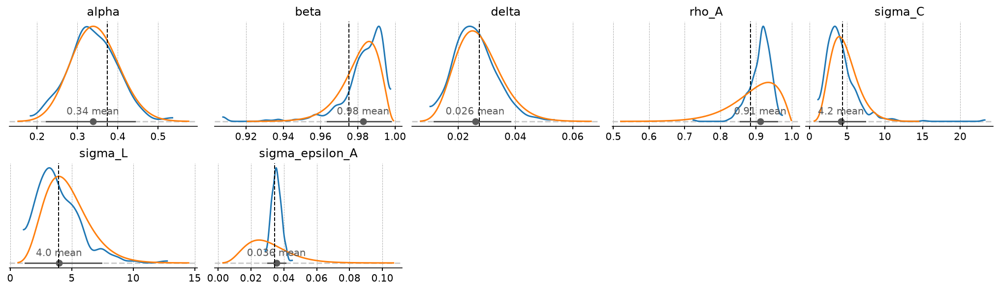

In [31]:
gp.plot_posterior_with_prior(
    idata=idata_laplace,
    true_values=true_params,
    prior_dict=prior_dict,
    var_names=deep_params,
    fig_kwargs={"figsize": (14, 4), "dpi": 144},
);

## MCMC 

Another option is to approximate the posterior using Markov Chain Monte Carlo. MCMC is a family of algorithms, so its useful to know a bit about the popular ones.

### Metropolis-Hastings

The "traditional" MCMC method is metropolis-hastings. This is what Dynare uses. It's a very simple, gradient free algorithm. We can use this as well in PyMC by specifiying `step=pm.Metropolis()`

We also have to specify that we want to use JAX mode via the `compile_kwargs` argument, and that we want to sample all the variables at once in a single step using `blocked=True`.

In [32]:
with pm_mod:
    idata_mh = pm.sample(
        step=pm.Metropolis(blocked=True),
        cores=4,
        chains=4,
        random_seed=rng,
    )

Multiprocess sampling (4 chains in 4 jobs)


Metropolis: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 17 seconds.


The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


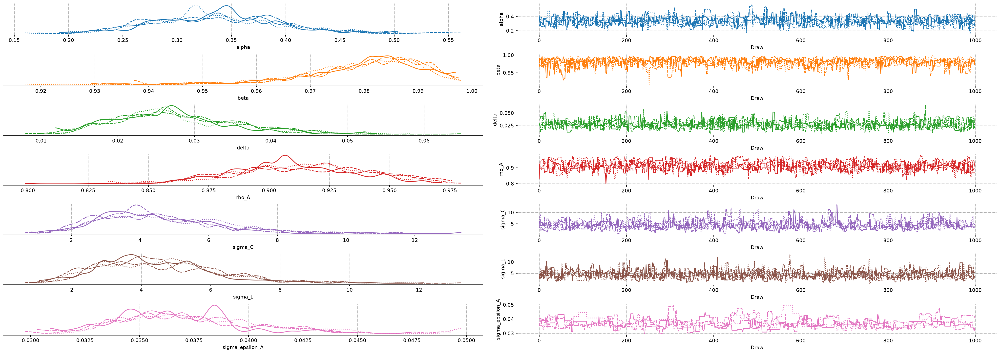

In [33]:
az.plot_trace_dist(idata_mh, var_names=deep_params);

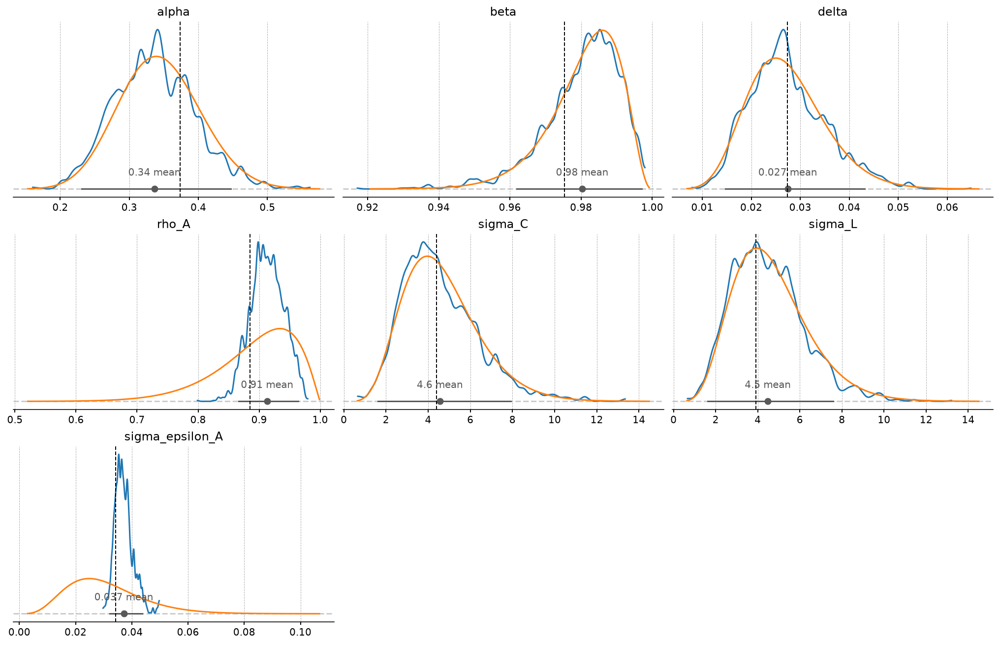

In [34]:
gp.plot_posterior_with_prior(
    idata_mh,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

### NUTS

A much better choice is NUTS, which is a state-of-the-art implementation of Hamiltonian Monte-Carlo. The best implementation is in `nutpie`. This too can be accessed through PyMC. Like above, we want to set all of the compile backend options to JAX, because it's faster.

In [35]:
with pm_mod:
    idata_nuts = pm.sample(
        cores=4,
        chains=4,
        random_seed=rng,
    )

NUTS[nutpie]: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A]


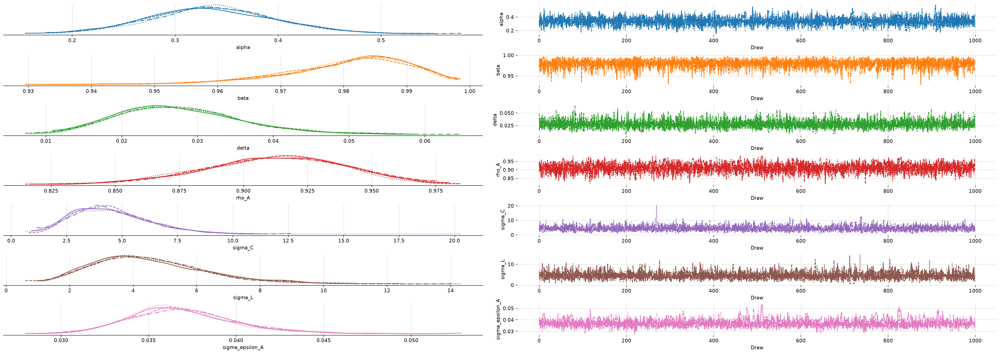

In [36]:
az.plot_trace_dist(idata_nuts, var_names=deep_params);

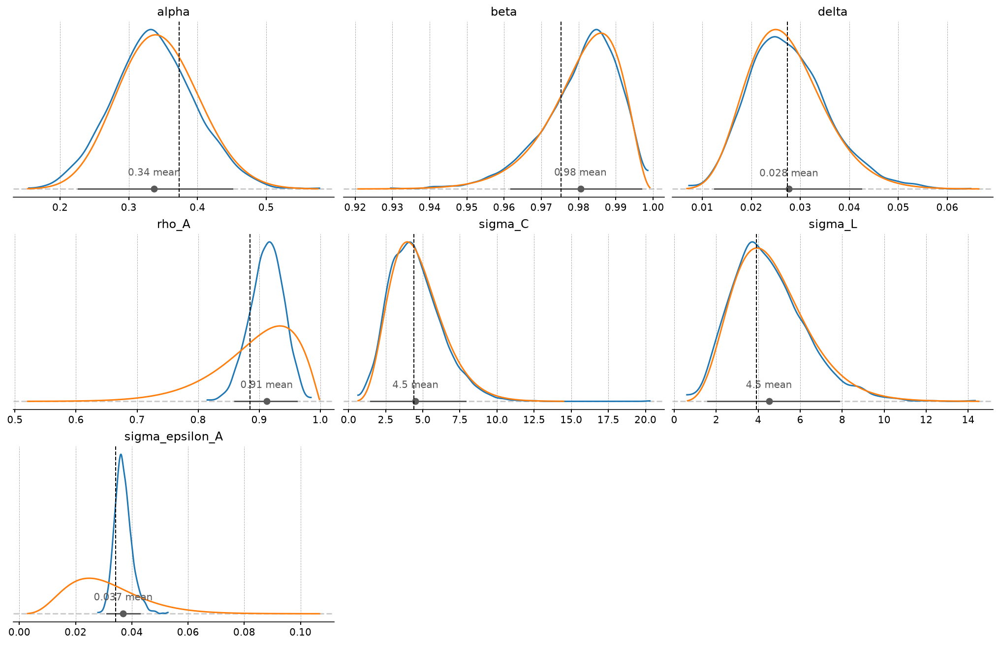

In [37]:
gp.plot_posterior_with_prior(
    idata_nuts,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

Aside from getting much nicer looking posteriors, we also get many many more effective samples using NUTS. This is why it is strongly preferred over MH. Sampling 4000 draws with MH resulted in between 150 - 2000 effective draws (bulk + tail), while sampling with NUTS result in 2000-5000! The r_hat statistic also indicates much better mixing with NUTS, suggesting all the chains independently converged to the true posterior.

Notice that there were several in NUTS, which suggests there might be some areas of ugly posterior geometry that we were unable to sample. This is expected, because DSGE models have so many numerical hoops that need to be jumped through for a successful fit: steady state, linearization, blanchard-khan conditions, and finding the optimal policy function. The sampler can't see all of this, so it's a miracle we get samples at all.

We can see the problems are likely caused by the very persistant shock estimate. The posterior mass for the $rho_A$ parameter is almost all concentrated between 0.98 and 1 (the true sampled parameter was 0.99). This makes numerical stability a bit more precarious as we go through the process of sample -> linearize -> solve.

We can try to reduce divergences by increasing the `target_accept` parameter, which I've already set to 0.95, up from the default of 0.8. This makes the samper take smaller, more cautious steps. The idea is that this will allow it to up right up to the regions of discontinunity, and explore as much as possible.

Conventional bayesian folklore is that the only correct number of divergences is 0, but in my testing, results look pretty dang good even though we hit a few.

In [38]:
import pandas as pd

mh_stats = az.summary(idata_mh, var_names=deep_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="Metropolis-Hastings"
)
nuts_stats = az.summary(idata_nuts, var_names=deep_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(model="NUTS")
pd.concat([mh_stats, nuts_stats]).reset_index().set_index(["index", "model"]).unstack("model")

ess_bulk                         ess_tail  \
model           Metropolis-Hastings         NUTS Metropolis-Hastings   
index                                                                  
alpha                    707.920414  4817.817748          670.632219   
beta                     475.769838  4276.120396          614.227488   
delta                    783.974223  4866.450722          758.023922   
rho_A                    395.328633  3326.874645          354.016489   
sigma_C                  451.269029  3225.258256          612.961130   
sigma_L                  702.659318  3175.610797          817.430809   
sigma_epsilon_A          124.765160  2506.673522          154.811833   

                                           r_hat            
model                   NUTS Metropolis-Hastings      NUTS  
index                                                       
alpha            2560.036950            1.003639  0.999932  
beta             2081.279182            1.012888  1.000678  
delta            2624.069672            1.001487  0.999806  
rho_A            2184.160550            1.011093  1.000560  
sigma_C          2394.773246            1.014667  1.002347  
sigma_L          2133.184348            1.006092  1.000300  
sigma_epsilon_A  1999.025194            1.035900  1.001731

# Comparing Results

We can compare the estimated posteriors between the three methods. On this simple RBC, they don't disagree so much. Laplace is fast, but the posterior doesn't respect the economic constraints imposed on the problem (we have alpha and delta less than 0, for example!). NUTS should be considered the "ground truth" because of its ability to completely explore the posterior space. 

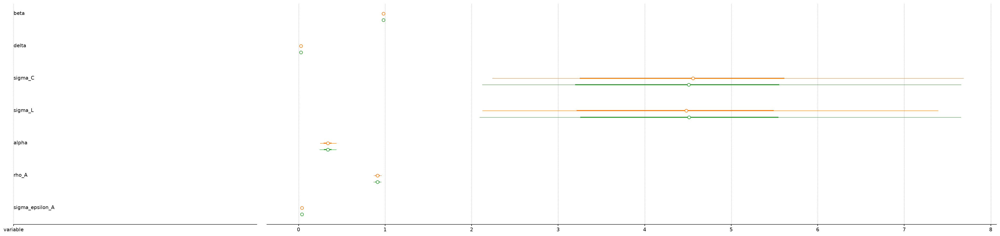

In [39]:
# fig, ax = plt.subplots(figsize=(9, 6), dpi=77)
az.plot_forest(
    {"Laplace": idata_laplace, "Metropolis-Hastings": idata_mh, "NUTS": idata_nuts},
    combined=True,
    var_names=deep_params,
)

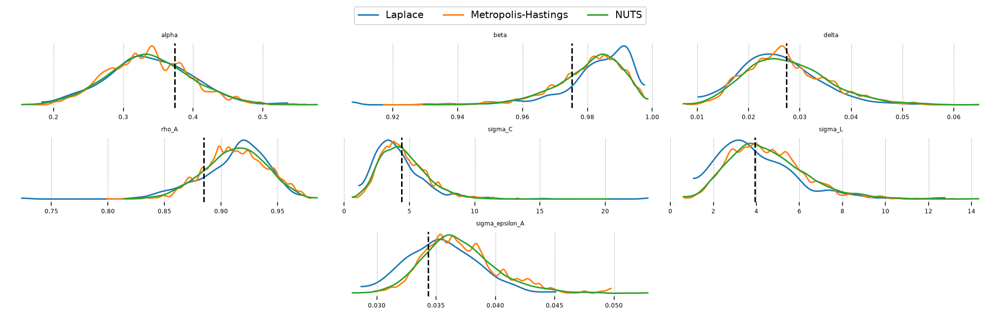

In [40]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(deep_params), figure=fig)
axes = [fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["tab10"]

idatas = [idata_laplace, idata_mh, idata_nuts]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names, strict=False)):
    kde = az.kde(idata, var_names=deep_params, group="posterior")
    for ax, param in zip(axes, deep_params, strict=False):
        d = kde[param]
        ax.plot(
            d.sel(plot_axis="x"),
            d.sel(plot_axis="y"),
            color=cmap[i],
            label=sampler if ax is axes[0] else None,
        )
        ax.set_title(param, fontsize=6)
        ax.tick_params(labelsize=6)
        ax.set_yticks([])

for ax, param in zip(axes, deep_params, strict=False):
    ax.axvline(true_param_dict[param], ls="--", color="k")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, ncols=3, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

## Post-Estimation 

Once we have a trace object, we can sample conditional and unconditional trajectories from the posterior

In [41]:
conditional_posterior = ss_mod.sample_conditional_posterior(idata_nuts, random_seed=rng)

Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


The estimation procedure does a good job recovering latent states in most cases. We noiselessly recover Y, since that was included as observed without measurement error. Our estimate of the TFP process is biased downward, but we capture the dynamics correctly, and the true process is within the 94% HDI. All other states look pretty good!


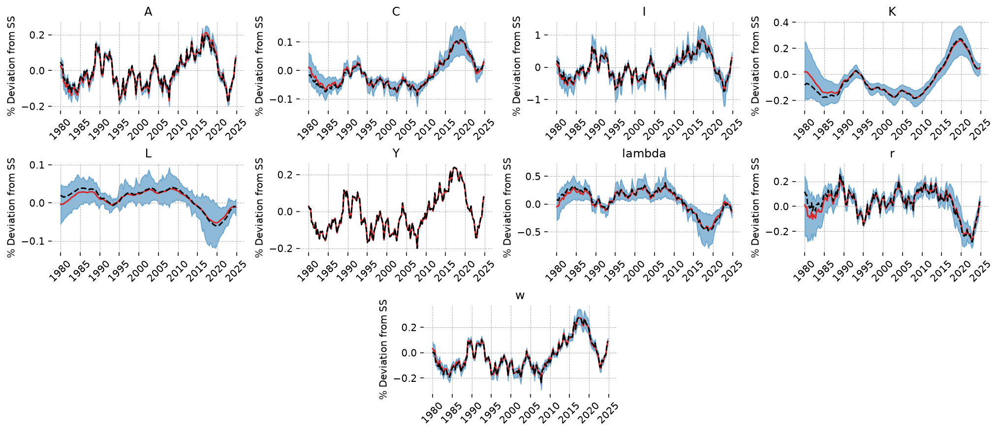

In [42]:
fig = gp.plot_kalman_filter(
    conditional_posterior,
    latent_data,
    kalman_output="smoothed",
);

We can also compute impulse response functions. Since there's only one shock, we pass an array with one element. We will look at a 10% shock to TFP

In [43]:
irf = ss_mod.impulse_response_function(idata_nuts, n_steps=20, shock_size=np.array([0.1]), random_seed=rng)

Sampling: []


We can see that TFP is extremely persistant; this is consistent with the posterior estimate of $rho_A$. As a result, we see "sticky" results in the other variables, with no re-convergence to the steady-state within the 20 periods we plot.

We also get 94% HDIs around the IRFs, "for free"

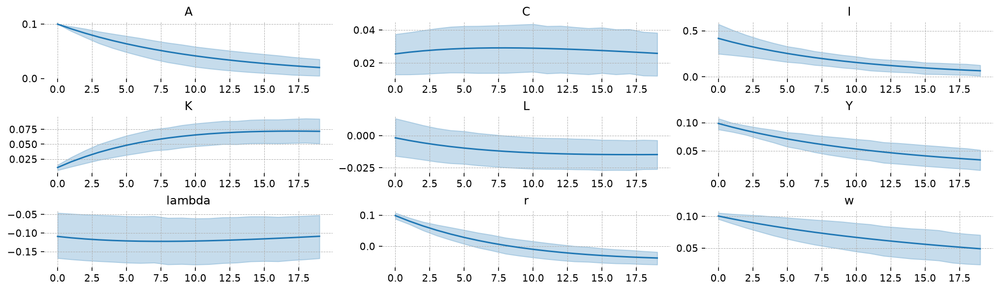

In [44]:
irf_mu = irf.mean(dim=["chain", "draw"]).irf
irf_hdi = az.hdi(irf).irf
x_grid = irf.irf["time"].values

vars_to_plot = ss_mod.state_names
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(vars_to_plot), figure=fig)

for var, loc in zip(vars_to_plot, locs, strict=False):
    axis = fig.add_subplot(gs[loc])
    axis.plot(x_grid, irf_mu.sel(state=var))
    axis.fill_between(x_grid, *irf_hdi.sel(state=var).values.T, color="tab:blue", alpha=0.25)
    axis.set_title(var)


plt.show()

# Adding more observed states

It is possible to add additional information to the estimation if we include measurement error on the observed data. We can only have as many observed states as we have sources of stochastic variation in the model; this is a condition required to identify the residual covariance matrix during Kalman filtering. Having fewer sources of stochastic variation than observed states is called **stochastic singularity**. gEconpy will refuse to estimate models that have a stochastic singularity.

This RBC model only has one source of variation, the innovations on the TFP process, `epsilon_A`. But measurement error also counts! So we can show the model $C, I, L, Y, r, w$. 

In [45]:
ss_mod.configure(
    observed_states=["Y", "C", "I", "L", "r", "w"],
    measurement_error=["Y", "C", "I", "L", "r", "w"],
    full_shock_covariance=False,
    solver="scan_cycle_reduction",
)

                  Model Requirements                  
                                                      
  Variable          Shape   Constraints   Dimensions  
 ──────────────────────────────────────────────────── 
  alpha             ()                          None  
  beta              ()                          None  
  delta             ()                          None  
  rho_A             ()                          None  
  sigma_C           ()                          None  
  sigma_L           ()                          None  
  sigma_epsilon_A   ()      Positive            None  
  error_sigma_Y     ()      Positive            None  
  error_sigma_C     ()      Positive            None  
  error_sigma_I     ()      Positive            None  
  error_sigma_L     ()      Positive            None  
  error_sigma_r     ()      Positive            None  
  error_sigma_w     ()      Positive            None  
                                                      
 These parameters should be assigned priors inside a  
         PyMC model block before calling the          
            build_statespace_graph method.            

In [46]:
prior_dict = ss_mod.param_priors.copy()

with pm.Model(coords=ss_mod.coords) as pm_mod:
    ss_mod.to_pymc()
    prior_dict["sigma_epsilon_A"] = pz.maxent(pz.Gamma(), lower=0.01, upper=0.1, plot=False)
    prior_dict["sigma_epsilon_A"].to_pymc("sigma_epsilon_A")

    for state in ["Y", "C", "I", "L", "r", "w"]:
        prior_dict[f"error_sigma_{state}"] = pz.maxent(pz.Gamma(), lower=0.01, upper=0.1, plot=False)
        prior_dict[f"error_sigma_{state}"].to_pymc(f"error_sigma_{state}")

In [47]:
error_params = [x for x in prior_dict if x.startswith("error")]

In [48]:
true_params, data, prior_idata = data_from_prior(ss_mod, pm_mod, random_seed=rng)
true_param_dict = {param: true_params[param].item() for param in deep_params}

Sampling: [alpha, beta, delta, error_sigma_C, error_sigma_I, error_sigma_L, error_sigma_Y, error_sigma_r, error_sigma_w, obs, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


Sampling: [prior_combined]


In [49]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(chain=0, draw=true_params.param_idx)
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

We can see now that the observed states (in red) are noisy compared to the underlying true states (blue). $A$, $K$, and $\lambda$ are not observed, so they have no noisy red counterpart

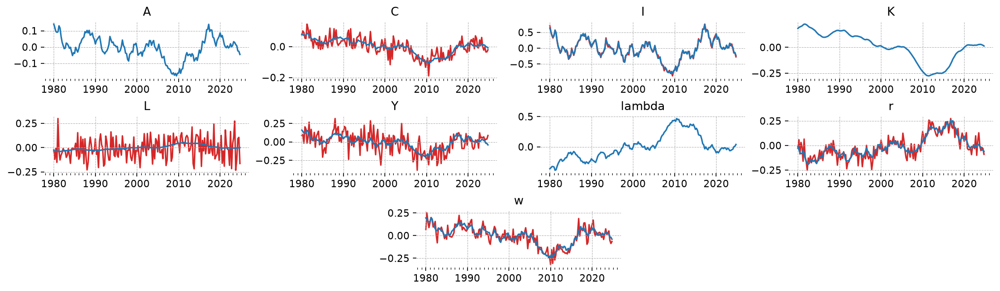

In [50]:
fig = gp.plot_timeseries(latent_data)
for axis in fig.axes:
    state = axis.get_title()
    if state in data:
        axis.plot(data.index, data[state], color="tab:red", zorder=-1)

## Laplace Approximation with More Observables

In [51]:
with pm_mod:
    ss_mod.build_statespace_graph(
        data,
        add_solver_success_check=True,
    )
    idata_laplace_2 = fit_laplace(
        optimize_method="trust-ncg",
        optimizer_kwargs={"tol": 1e-12},
    )

What's nice about including more variables, even with measurement error, is that we now have more information about the deep parameters, allowing for their identification. In the first example, we got back the priors for everything except $\rho_A$ and $\sigma_{\varepsilon_A}$, whereas we now get accurate estimates for $\alpha$, $\delta$, $\sigma_C$ and $\sigma_L$.

One nice thing about the Bayesian framework is that when a deep parameter is not identified, we just get back the prior. Basically there's never any cost to *not* putting a prior on a parameter. Setting a value to fixed essentially means putting a Dirac prior on it that rejects any other possible value, which is a priori silly -- we don't have that level of confidence on any of these. 

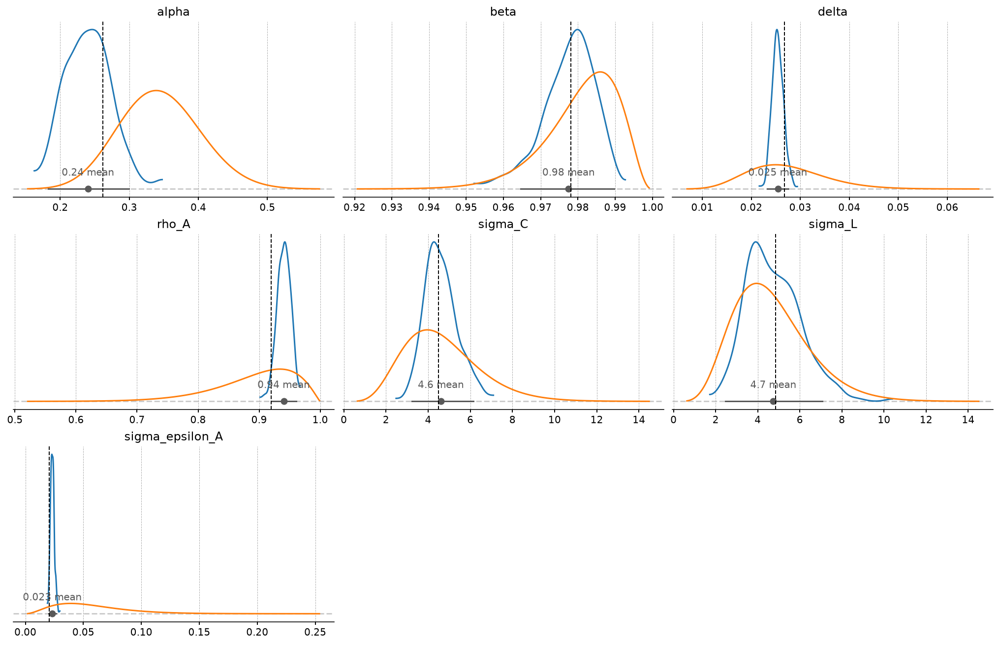

In [52]:
gp.plot_posterior_with_prior(
    idata_laplace_2,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

## Metropolis-Hastings with More Observables

In [53]:
with pm_mod:
    idata_mh_2 = pm.sample(
        step=pm.Metropolis(blocked=True),
        cores=4,
        chains=4,
        random_seed=rng,
    )

Multiprocess sampling (4 chains in 4 jobs)


Metropolis: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A, error_sigma_Y, error_sigma_C, error_sigma_I, error_sigma_L, error_sigma_r, error_sigma_w]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 55 seconds.


The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In the model with only one observed state, MH did a passable job. Now, with this somewhat more complex model, it's utterly hopeless. We can see that the chains are extremely autocorrelated. Assuming they entered the typical set during tuning, they certaintly aren't exploring it effectively!

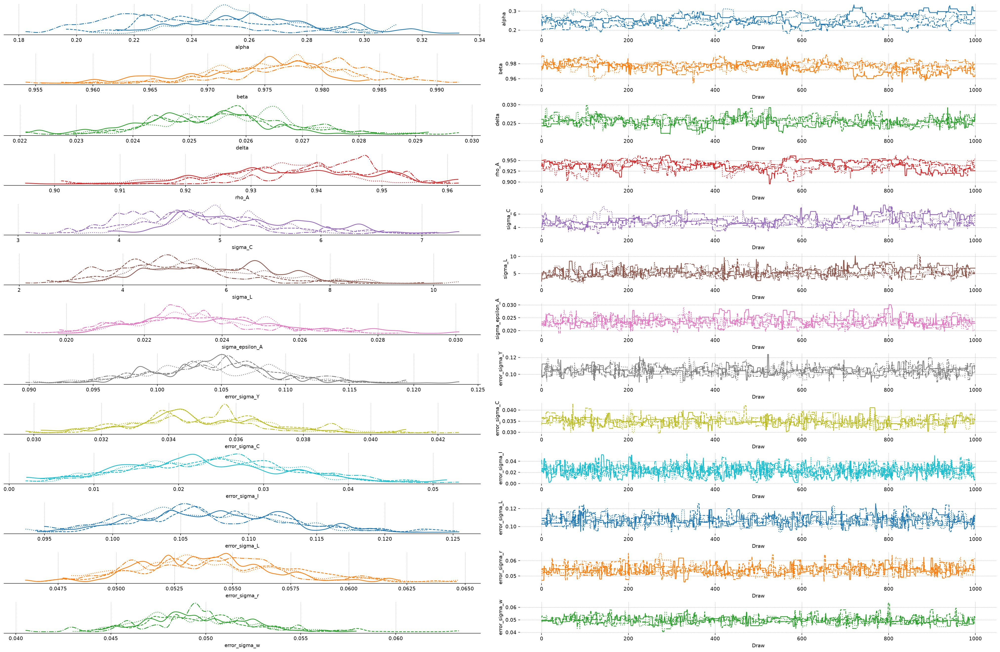

In [54]:
az.plot_trace_dist(idata_mh_2, var_names=deep_params + error_params);

## NUTS with More Observables

In [55]:
with pm_mod:
    idata_nuts_2 = pm.sample(
        nuts_sampler="nutpie",
        cores=4,
        chains=4,
        random_seed=rng,
    )

NUTS[nutpie]: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A, error_sigma_Y, error_sigma_C, error_sigma_I, error_sigma_L, error_sigma_r, error_sigma_w]


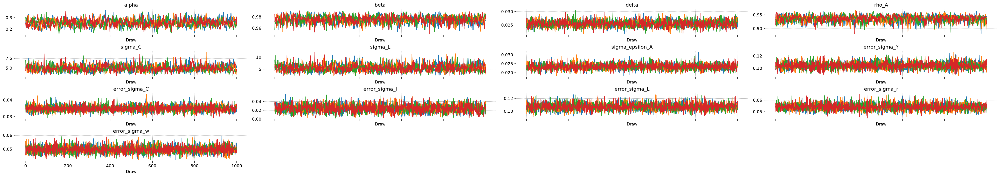

In [56]:
az.plot_trace(idata_nuts_2, var_names=deep_params + error_params);

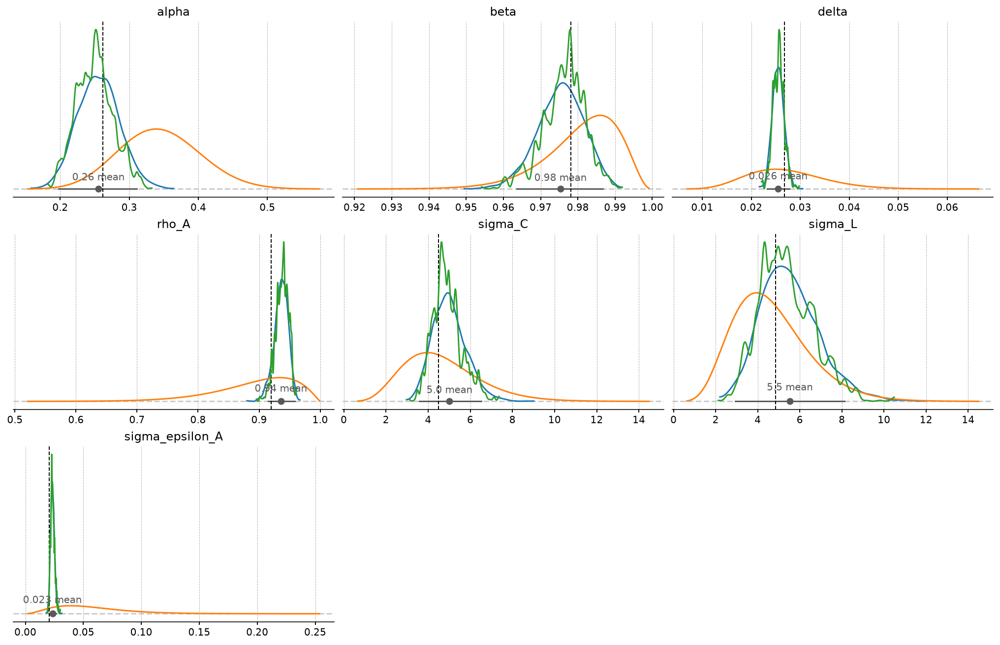

In [57]:
fig = gp.plot_posterior_with_prior(
    idata_nuts_2,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
)
axes_by_title = {ax.get_title(): ax for ax in fig.axes}
kde = az.kde(idata_mh_2, var_names=deep_params, group="posterior")
for default_ax, param in zip(fig.axes, deep_params, strict=False):
    ax = axes_by_title.get(param, default_ax)
    d = kde[param]
    ax.plot(d.sel(plot_axis="x"), d.sel(plot_axis="y"), color="tab:green")
plt.show()

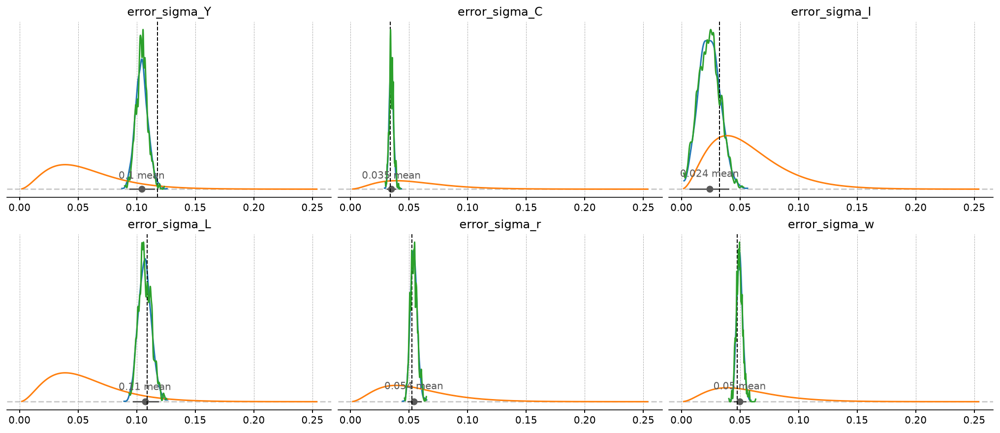

In [58]:
fig = gp.plot_posterior_with_prior(
    idata_nuts_2,
    var_names=error_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
)
axes_by_title = {ax.get_title(): ax for ax in fig.axes}
kde = az.kde(idata_mh_2, var_names=error_params, group="posterior")
for default_ax, param in zip(fig.axes, error_params, strict=False):
    ax = axes_by_title.get(param, default_ax)
    d = kde[param]
    ax.plot(d.sel(plot_axis="x"), d.sel(plot_axis="y"), color="tab:green")
plt.show()

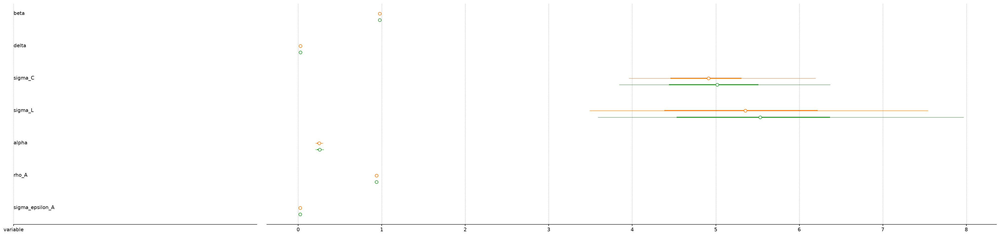

In [59]:
az.plot_forest(
    {"Laplace": idata_laplace_2, "Metropolis-Hastings": idata_mh_2, "NUTS": idata_nuts_2},
    combined=True,
    var_names=deep_params,
)

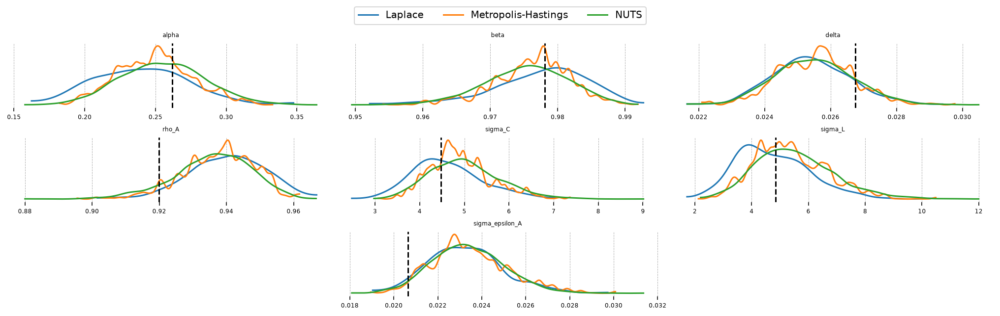

In [60]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(deep_params), figure=fig)
axes = [fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["tab10"]

idatas = [idata_laplace_2, idata_mh_2, idata_nuts_2]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names, strict=False)):
    kde = az.kde(idata, var_names=deep_params, group="posterior")
    for ax, param in zip(axes, deep_params, strict=False):
        d = kde[param]
        ax.plot(
            d.sel(plot_axis="x"),
            d.sel(plot_axis="y"),
            color=cmap[i],
            label=sampler if ax is axes[0] else None,
        )
        ax.set_title(param, fontsize=6)
        ax.tick_params(labelsize=6)
        ax.set_yticks([])

for ax, param in zip(axes, deep_params, strict=False):
    ax.axvline(true_param_dict[param], ls="--", color="k")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, ncols=3, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

In [61]:
mh_stats = az.summary(idata_mh_2, var_names=deep_params + error_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="Metropolis-Hastings"
)
nuts_stats = az.summary(idata_nuts_2, var_names=deep_params + error_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="NUTS"
)
pd.concat([mh_stats, nuts_stats]).reset_index().set_index(["index", "model"]).unstack("model")

ess_bulk                         ess_tail  \
model           Metropolis-Hastings         NUTS Metropolis-Hastings   
index                                                                  
alpha                     10.647248  1078.872935           20.764732   
beta                      16.385180  1259.225467           34.895360   
delta                    134.555647  2772.400290          268.127370   
error_sigma_C            376.746990  5690.216206          377.020908   
error_sigma_I            563.568977  3367.762396          636.638643   
error_sigma_L            435.857823  6260.911371          398.711488   
error_sigma_Y            512.729806  6333.582749          420.610376   
error_sigma_r            409.002481  6086.467364          422.862449   
error_sigma_w            387.118424  6273.701336          286.650493   
rho_A                     36.768011  1408.457512           79.944096   
sigma_C                   17.467796  1285.113221           27.900348   
sigma_L                   26.724998  1626.827145           59.341323   
sigma_epsilon_A          266.370951  4644.207135          322.315652   

                                           r_hat            
model                   NUTS Metropolis-Hastings      NUTS  
index                                                       
alpha            1318.680181            1.307729  1.003507  
beta             1697.113676            1.185946  1.001559  
delta            2674.764647            1.037310  1.000228  
error_sigma_C    3167.021771            1.005653  1.000532  
error_sigma_I    2045.508443            1.005630  1.002312  
error_sigma_L    3219.795014            1.014723  0.999711  
error_sigma_Y    3175.469728            1.006012  1.000113  
error_sigma_r    3262.356337            1.011076  1.003101  
error_sigma_w    3394.680423            1.011473  1.000050  
rho_A            1684.723534            1.096097  1.001852  
sigma_C          1939.613617            1.175568  1.001131  
sigma_L          2218.697134            1.112782  1.000341  
sigma_epsilon_A  2950.425367            1.021944  1.000594

## Bonus: NUTS with Normalizing Flows (Fisher HMC)

NUTS is a very good sampler, but as we've seen, it can struggle when faced with awkward posterior geometries, such as ours. A brand new, highly experimental method of dealing with this involves combining normalizing flows with NUTS. 

The idea is simple: since our posterior geometry sucks, let's just go get a better one!

Specifically, we're going to sample using NUTS for a bit, then stop and take a look at what we've obtained. We use a neural network to learn to transform these samples in a way that make them look as much like draws from iid gaussians as possible. The transformation we learn is special for two reasons:

1. It's bijective, so we can go from our "true" space to the iid space, or from the iid space back to the true space, and;
2. We know what the determinant of the jacobian that describes this transformtion is. This means we can track how the transformation distorts areas and take that distortion into account. 

Point 2 matters a lot, because we want to sample from the nice iid space, then convert the draws back to the true posterior space. This is a [change of variables](https://en.wikipedia.org/wiki/Probability_density_function#Function_of_random_variables_and_change_of_variables_in_the_probability_density_function), so we have to account for that distortion of space. Luckily we can, so we can do MCMC in this better space, then transform back to the true posterior space!

This functionality is still experimental, so we import nutpie and set it up ourselves rather than going through `pm.sample`. We compile the model with `nutpie.compile_pymc_model`, using the JAX backend because the flow is trained in JAX, and call `nutpie.sample` with `adaptation="flow"`. The flow has lots of hyperparameters to choose (we're dealing with neural networks, after all), and `with_transform_adapt` is where they go. The defaults work pretty well, so that's what we'll use.

In [62]:
import nutpie as ntp

ntp_model = ntp.compile_pymc_model(pm_mod, freeze_model=True, backend="jax", gradient_backend="jax")

Although it takes some time to learn the transformation (that is, to train the neural network), sampling as actually faster with this method! That's because once we're done tuning, we require many many fewer gradient evaluations to obtain samples. 

Notice that divergences go down significantly (from 30-40 to 2-7), and we were able to keep the `target_accept` at the default.

One could play with the hyperparameters to get to get the divergences down to zero, but this is already a huge improvement.

In [63]:
# Set verbose = True to see some nice terminal spam about what the algorithm is doing
idata_fisher = ntp.sample(
    ntp_model.with_transform_adapt(verbose=False),
    chains=4,
    cores=4,
    draws=1000,
    tune=1000,
    # adaptation="flow" turns on the normalizing-flow augmented sampling
    adaptation="flow",
)

# nutpie's raw output carries no data groups, and post-estimation sampling recovers the fit from them
idata_fisher["observed_data"] = idata_nuts_2["observed_data"]
idata_fisher["constant_data"] = idata_nuts_2["constant_data"]

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.84,7
,2000,0,0.76,7
,2000,0,0.78,7
,2000,0,0.79,7


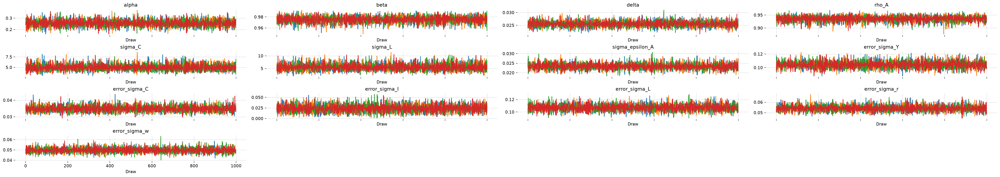

In [64]:
az.plot_trace(idata_fisher, var_names=deep_params + error_params);

The imporovement here is clear as well. Start by noticing the `r_hat` statisitic for the Fisher-NF NUTS algorithm is all 1.0, indiciating excellent mixing of the chains. MH is hopeless, and NUTS still has some small defects.

Looking at the effective samples, you can see that even the hardest to sample parameters -- $\alpha$ and $\beta$ -- get thousands of samples when using Fisher-NF, while we got only hundreds with NUTS, and only 6(!!!) with MH. 

All this, and better speed, too!

In [65]:
mh_stats = az.summary(idata_mh_2, var_names=deep_params + error_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="Metropolis-Hastings"
)
nuts_stats = az.summary(idata_nuts_2, var_names=deep_params + error_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="NUTS"
)
fisher_stats = az.summary(idata_fisher, var_names=deep_params + error_params)[["ess_bulk", "ess_tail", "r_hat"]].assign(
    model="Fisher-NF NUTS"
)

pd.concat([mh_stats, nuts_stats, fisher_stats]).reset_index().set_index(["index", "model"]).unstack("model")

ess_bulk                                   \
model           Fisher-NF NUTS Metropolis-Hastings         NUTS   
index                                                             
alpha              6953.380072           10.647248  1078.872935   
beta               6826.262086           16.385180  1259.225467   
delta              7832.877907          134.555647  2772.400290   
error_sigma_C      8220.003631          376.746990  5690.216206   
error_sigma_I      7505.947100          563.568977  3367.762396   
error_sigma_L      7026.104606          435.857823  6260.911371   
error_sigma_Y      5992.724285          512.729806  6333.582749   
error_sigma_r      7358.782255          409.002481  6086.467364   
error_sigma_w      7581.534995          387.118424  6273.701336   
rho_A              7235.438867           36.768011  1408.457512   
sigma_C            6643.892385           17.467796  1285.113221   
sigma_L            7437.429849           26.724998  1626.827145   
sigma_epsilon_A    6579.523118          266.370951  4644.207135   

                      ess_tail                                   \
model           Fisher-NF NUTS Metropolis-Hastings         NUTS   
index                                                             
alpha              3244.853621           20.764732  1318.680181   
beta               2806.296926           34.895360  1697.113676   
delta              3505.569287          268.127370  2674.764647   
error_sigma_C      2923.031174          377.020908  3167.021771   
error_sigma_I      3301.648305          636.638643  2045.508443   
error_sigma_L      3333.877650          398.711488  3219.795014   
error_sigma_Y      2949.847416          420.610376  3175.469728   
error_sigma_r      3140.464446          422.862449  3262.356337   
error_sigma_w      3020.514755          286.650493  3394.680423   
rho_A              2952.371778           79.944096  1684.723534   
sigma_C            2918.447417           27.900348  1939.613617   
sigma_L            2984.462735           59.341323  2218.697134   
sigma_epsilon_A    3187.092295          322.315652  2950.425367   

                         r_hat                                
model           Fisher-NF NUTS Metropolis-Hastings      NUTS  
index                                                         
alpha                 1.002129            1.307729  1.003507  
beta                  0.999699            1.185946  1.001559  
delta                 1.000287            1.037310  1.000228  
error_sigma_C         1.000625            1.005653  1.000532  
error_sigma_I         1.001913            1.005630  1.002312  
error_sigma_L         1.000876            1.014723  0.999711  
error_sigma_Y         0.999829            1.006012  1.000113  
error_sigma_r         0.999739            1.011076  1.003101  
error_sigma_w         1.002042            1.011473  1.000050  
rho_A                 1.001780            1.096097  1.001852  
sigma_C               1.002548            1.175568  1.001131  
sigma_L               1.003178            1.112782  1.000341  
sigma_epsilon_A       1.001289            1.021944  1.000594

In [66]:
fisher_post = ss_mod.sample_conditional_posterior(idata_fisher, random_seed=rng)

Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


## Hidden State Inference

We can see that the Kalman smoother does an excellent job of filtering the latent signal (black line) from the noisy observations (orange). Including extra data has helped us better identify both the deep parameters and the hidden states, even though that data was treated as noisy!  

In [67]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(chain=0, draw=true_params.param_idx)
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

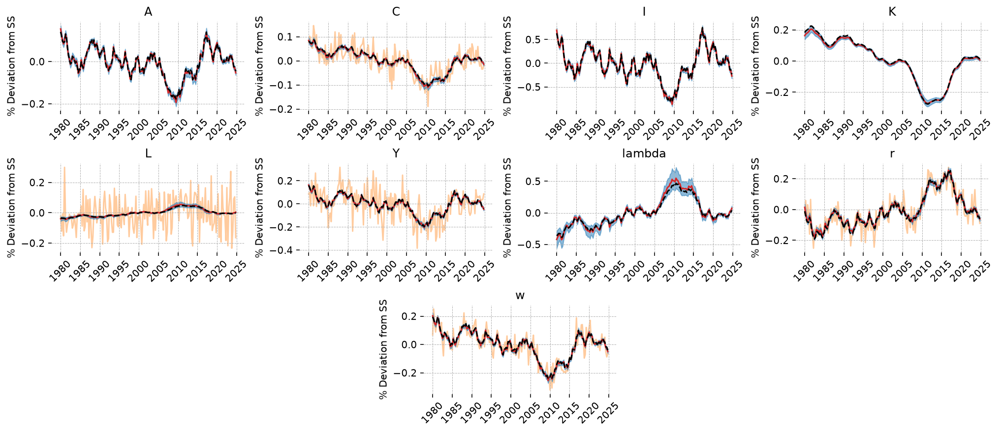

In [68]:
fig = gp.plot_kalman_filter(
    fisher_post,
    latent_data,
    kalman_output="smoothed",
)
for axis in fig.axes:
    var = axis.get_title()
    if var in data:
        axis.plot(data.index, data[var], color="tab:orange", zorder=-10, alpha=0.4)

One final comparison between all 4 sampling methods.

Note that NUTS and Fisher-NF NUTS don't look much different on these plots. This suggests that we're not systematically losing information due to NUTS not accessing part of the posterior (that is, due to the divergences). But better is still better!

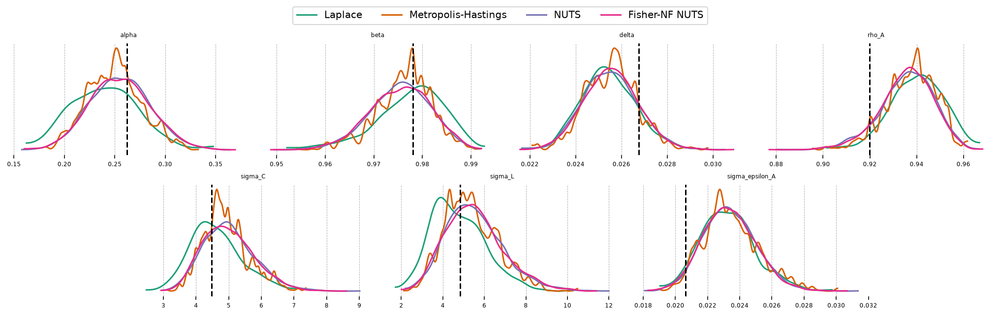

In [69]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=4, n_plots=len(deep_params), figure=fig)
axes = [fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["Dark2"]

idatas = [idata_laplace_2, idata_mh_2, idata_nuts_2, idata_fisher]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS", "Fisher-NF NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names, strict=False)):
    kde = az.kde(idata, var_names=deep_params, group="posterior")
    for ax, param in zip(axes, deep_params, strict=False):
        d = kde[param]
        ax.plot(
            d.sel(plot_axis="x"),
            d.sel(plot_axis="y"),
            color=cmap[i],
            label=sampler if ax is axes[0] else None,
        )
        ax.set_title(param, fontsize=6)
        ax.tick_params(labelsize=6)
        ax.set_yticks([])

for ax, param in zip(axes, deep_params, strict=False):
    ax.axvline(true_param_dict[param], ls="--", color="k")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, ncols=4, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

# Authors

- Authored by Jesse Grabowski in March 2025
- Updated by Jesse Grabowski in September 2026


# Watermark

In [70]:
%load_ext watermark
%watermark -n -u -v -iv -w -p gEconpy

Last updated: Wed, 16 Sep 2026

Python implementation: CPython
Python version       : 3.12.14
IPython version      : 9.17.1

gEconpy: 2.2.1.dev37+g2d175e5c4.d20260916

arviz      : 1.3.0
gEconpy    : 2.2.1.dev37+g2d175e5c4.d20260916
matplotlib : 3.11.1
numpy      : 2.4.6
nutpie     : 0.16.11
pandas     : 3.0.5
preliz     : 0.28.0
pymc       : 6.3.1
pymc_extras: 0.15.1

Watermark: 2.6.0

